In [1]:
# 라이브러리 불러오기

# 경고 무시하는 함수
import warnings
warnings.filterwarnings("ignore")

import tensorflow as tf
import tensorflow_datasets as tfds

import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# 딥러닝 모델 생성에 필요한 함수들
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D


In [2]:
!mkdir -p ~/aiffel/cats_vs_dogs/PetImages
!ln -s ~/data/* ~/aiffel/cats_vs_dogs/

In [3]:
# 데이터셋 다운로드, 학습데이터 3개로 쪼개기(학습데이터/검증데이터/테스트데이터)
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='cats_vs_dogs',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    data_dir='~/aiffel/cats_vs_dogs/',
    download=True,
    with_info=True,
    as_supervised=True,
)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling /root/aiffel/cats_vs_dogs/cats_vs_dogs/4.0.0.incompleteKL3X87/cats_vs_dogs-train.tfrecord*...:   0%|…

Dataset cats_vs_dogs downloaded and prepared to /root/aiffel/cats_vs_dogs/cats_vs_dogs/4.0.0. Subsequent calls will reuse this data.


In [4]:
print(raw_train)
print(raw_validation)
print(raw_test)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


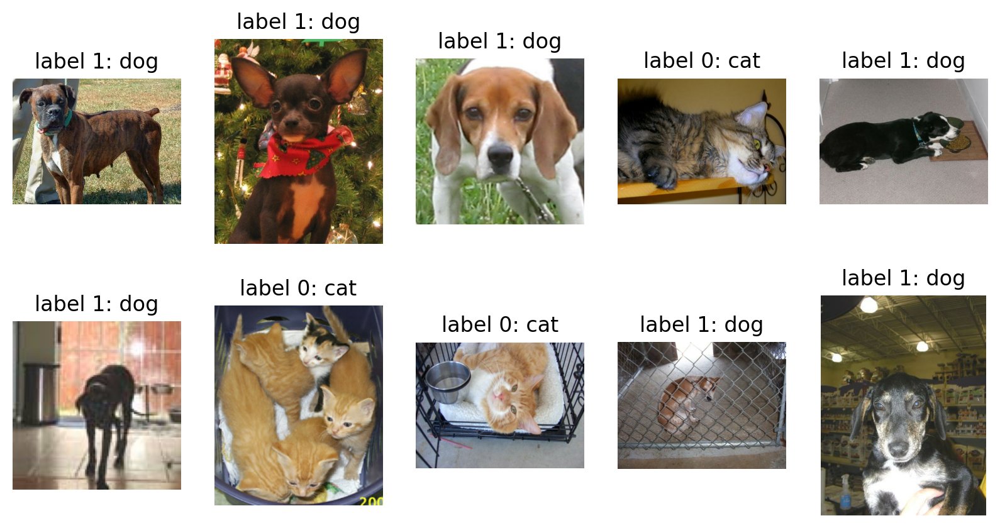

In [5]:
# 10개의 데이터를 가지고 와서 라벨링 하여 사진으로 보여주기(고양이:0, 강아지:1))
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [6]:
IMG_SIZE = 160 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [7]:
# format 함수를 이용하여 160*160으로 리사이징
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


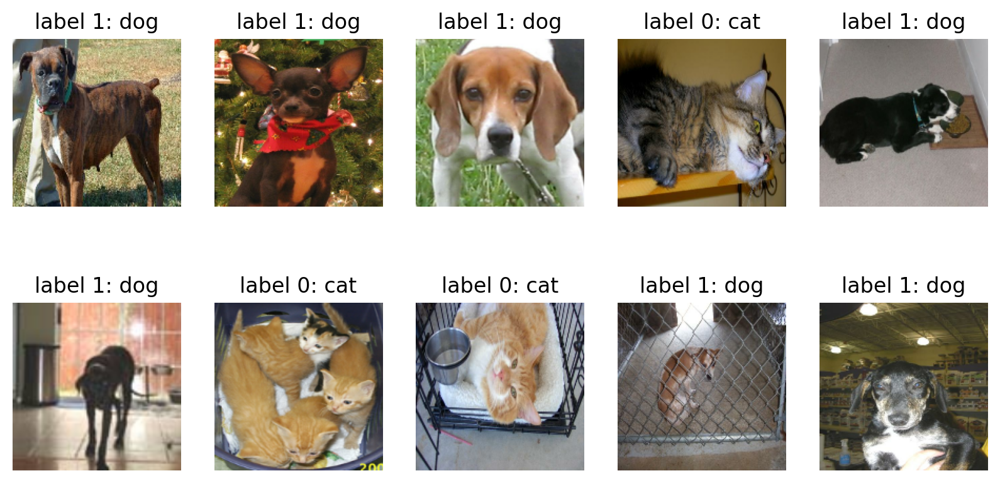

In [8]:
# matplotlib으로 이미지를 시각화 할 경우에는 모든 픽셀값이 양수여야 하므로,
# -1~1 사이의 픽셀값을 1을 더한 후 2로 나눠서 0~1 사이의 값으로 변환하여 160*160 이미지 10장을 출
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [9]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])

In [10]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 160, 160, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 80, 80, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 80, 80, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 40, 40, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 40, 40, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 20, 20, 64)       0

In [11]:
# 학습률 0.0001로 설정하여 모델 컴파일
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [12]:
# 한 스텝에 학습시킬 데이터의 개수인 BATCH_SIZE 30 설정하고 학습 데이터를 적절히 섞어줄 SHUFFLE_BUFFER_SIZE 1000으로 설
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [13]:
# train_batches에서 하나의 batch만 꺼내 데이터를 확인
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [14]:
# 초기 모델의 성능 보기: 로스 70%/ 정확도 46%
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 [==============================] - 8s 45ms/step - loss: 0.6911 - accuracy: 0.5344
initial loss: 0.69
initial accuracy: 0.53


In [15]:
# 에폭 5으로 주고 모델 학습(시간이 넘 많이 걸려서 5만 줌)
EPOCHS = 5
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
582/582 [==============================] - 50s 76ms/step - loss: 0.6227 - accuracy: 0.6512 - val_loss: 0.5806 - val_accuracy: 0.7059
Epoch 2/5
582/582 [==============================] - 47s 78ms/step - loss: 0.5283 - accuracy: 0.7336 - val_loss: 0.5139 - val_accuracy: 0.7472
Epoch 3/5
582/582 [==============================] - 45s 74ms/step - loss: 0.4662 - accuracy: 0.7783 - val_loss: 0.4861 - val_accuracy: 0.7756
Epoch 4/5
582/582 [==============================] - 45s 73ms/step - loss: 0.4146 - accuracy: 0.8130 - val_loss: 0.4725 - val_accuracy: 0.7850
Epoch 5/5
582/582 [==============================] - 43s 72ms/step - loss: 0.3687 - accuracy: 0.8389 - val_loss: 0.4859 - val_accuracy: 0.7773


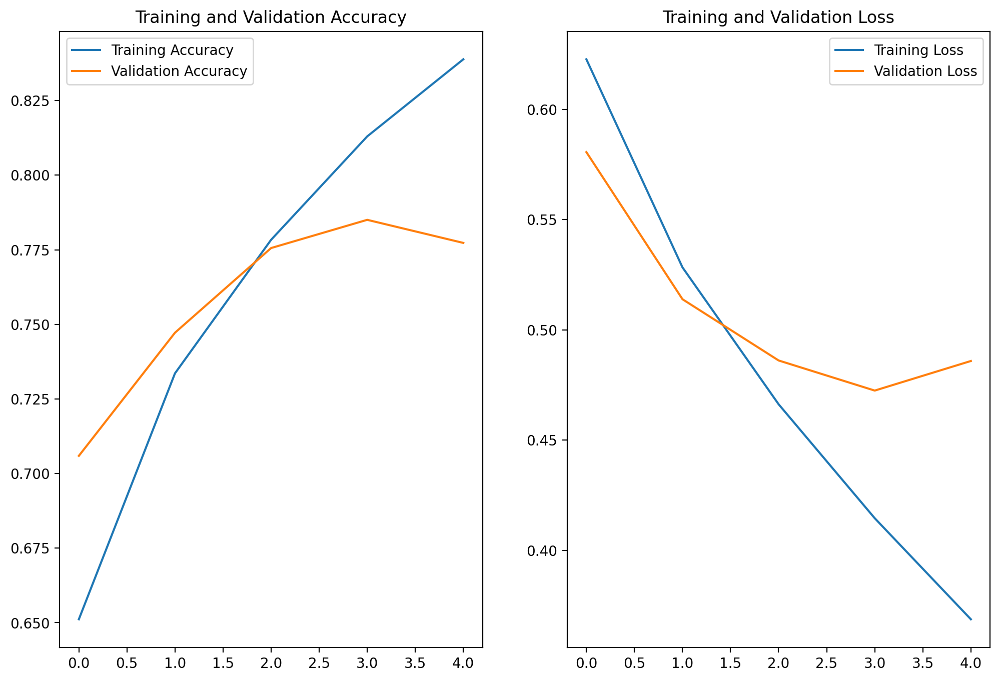

In [16]:
# 학습한 모델 성능 그래프로 보기: 학습/검증 데이터 정확도와 손실 그래프
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [17]:
# 테스트 데이터에서, 모델 예측 결과 확인(model.predict 사용)
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

1/1 [==============================] - 0s 108ms/step


array([[9.4852024e-01, 5.1479749e-02],
       [7.3992825e-01, 2.6007169e-01],
       [1.7146997e-01, 8.2853001e-01],
       [9.2808843e-01, 7.1911551e-02],
       [7.0150590e-01, 2.9849413e-01],
       [1.2827262e-01, 8.7172735e-01],
       [7.5264685e-02, 9.2473531e-01],
       [3.0121008e-01, 6.9878989e-01],
       [1.6475718e-01, 8.3524287e-01],
       [1.6021144e-01, 8.3978850e-01],
       [2.5740823e-01, 7.4259180e-01],
       [9.4631195e-01, 5.3688049e-02],
       [8.7470990e-01, 1.2529011e-01],
       [6.6198677e-02, 9.3380129e-01],
       [8.7109089e-01, 1.2890913e-01],
       [9.5725310e-01, 4.2746946e-02],
       [4.6229151e-01, 5.3770846e-01],
       [6.0758181e-04, 9.9939239e-01],
       [5.9947067e-01, 4.0052935e-01],
       [8.4907490e-01, 1.5092507e-01],
       [4.6875140e-01, 5.3124857e-01],
       [7.2125906e-01, 2.7874088e-01],
       [9.5729703e-01, 4.2702943e-02],
       [6.7592251e-01, 3.2407746e-01],
       [1.8323153e-01, 8.1676847e-01],
       [1.7065710e-01, 8.

In [18]:
# prediction 값들을 실제 추론한 라벨(고양이:0, 강아지:1)로 변환
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0,
       0, 0, 1, 1, 0, 1, 0, 0, 0, 0])

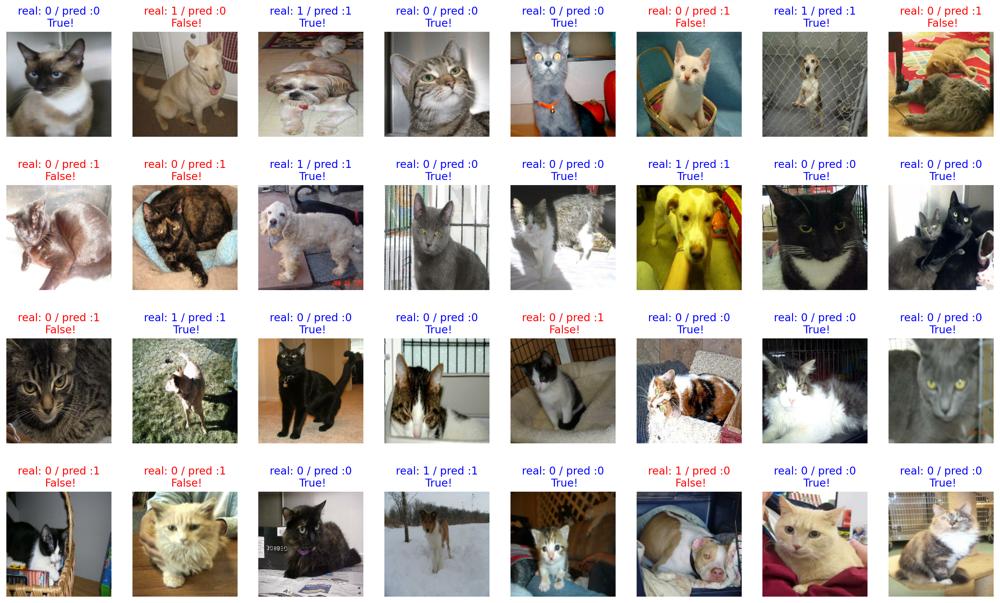

In [19]:
# batch 사이즈를 32로 설정하였으므로, 32장의 image/ 32개의 label /32개의 prediction을 각각을 시각화해서 확인
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [20]:
# 32개 이미지 중에서 예측(prediction)의 정확도(accuracy) 얼마인지 정답을 맞춘 갯수
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)

68.75


In [21]:
# Trensfer Learning
# 사전 학습 모델인 VGG16을 가져오고, 모델의 구조 확인하기
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

58889256/58889256 [==============================] - 4s 0us/step


In [22]:
# image_batch의 원래 사이즈를 다시 확인
image_batch.shape

TensorShape([32, 160, 160, 3])

In [23]:
# image_batch를 base_model(VGG16)에 넣어서 사이즈 확인
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [24]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 160, 160, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 160, 160, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 80, 80, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 80, 80, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 80, 80, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 40, 40, 128)       0     

In [25]:
# 평균값을 활용해 벡터의 차원을 줄여서 1차원으로 만들기: Global Average Pooling 사용
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [26]:
# base_model(VGG16)을 사용하여 Dense layer를 2개 쌓아주고 모델 설계
for layer in base_model.layers:
    layer.trainable = False

model = Sequential()
model.add(base_model)
model.add(global_average_layer)
model.add(Dense(512, activation='relu'))
model.add(Dense(2, activation='softmax'))

model.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.0001),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [27]:
# 에폭 5으로 주고 모델 학습
EPOCHS = 5
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    batch_size = BATCH_SIZE,
                    validation_data=validation_batches)

Epoch 1/5
582/582 [==============================] - 58s 90ms/step - loss: 0.2620 - accuracy: 0.9058 - val_loss: 0.1770 - val_accuracy: 0.9286
Epoch 2/5
582/582 [==============================] - 49s 82ms/step - loss: 0.1627 - accuracy: 0.9342 - val_loss: 0.1582 - val_accuracy: 0.9372
Epoch 3/5
582/582 [==============================] - 51s 84ms/step - loss: 0.1484 - accuracy: 0.9381 - val_loss: 0.1480 - val_accuracy: 0.9407
Epoch 4/5
582/582 [==============================] - 49s 82ms/step - loss: 0.1408 - accuracy: 0.9435 - val_loss: 0.1426 - val_accuracy: 0.9415
Epoch 5/5
582/582 [==============================] - 56s 93ms/step - loss: 0.1361 - accuracy: 0.9447 - val_loss: 0.1498 - val_accuracy: 0.9390


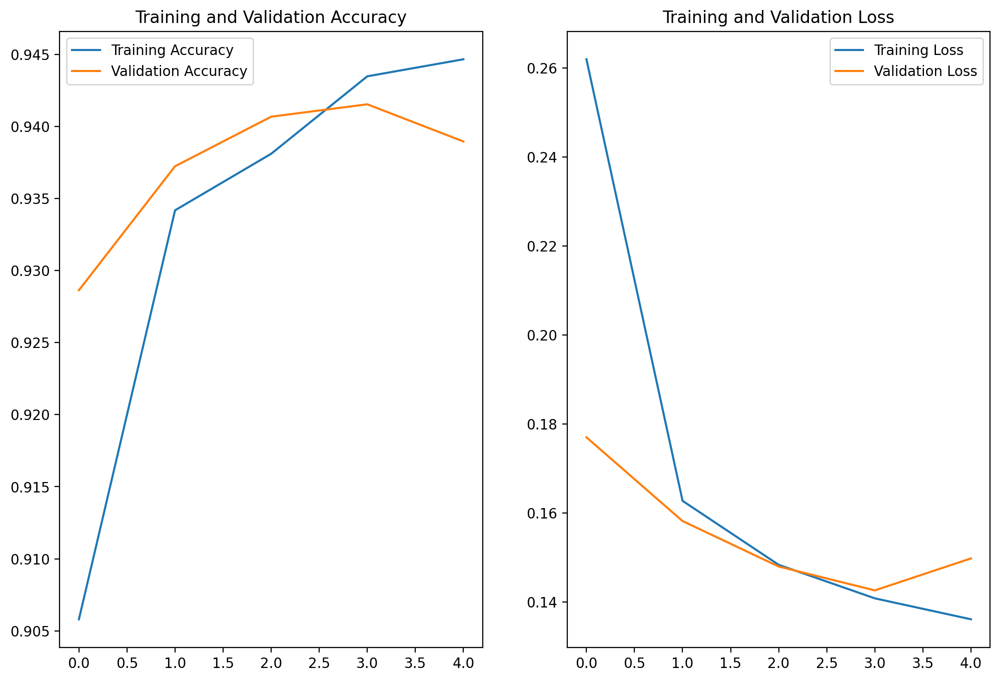

In [28]:
# 학습한 모델 성능 그래프로 보기: 학습/검증 데이터 정확도와 손실 그래
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [29]:
# 테스트 데이터에서, 모델 예측 결과 확인(model.predict 사용)
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

1/1 [==============================] - 0s 144ms/step


array([[9.99972820e-01, 2.71857716e-05],
       [9.26852673e-02, 9.07314718e-01],
       [2.34082505e-01, 7.65917480e-01],
       [9.99989152e-01, 1.09034627e-05],
       [9.93551493e-01, 6.44844770e-03],
       [9.81948674e-01, 1.80512723e-02],
       [1.00639314e-04, 9.99899387e-01],
       [5.45401692e-01, 4.54598308e-01],
       [9.12052929e-01, 8.79470855e-02],
       [9.43892956e-01, 5.61070368e-02],
       [3.91836802e-05, 9.99960780e-01],
       [9.99860525e-01, 1.39455107e-04],
       [9.80781555e-01, 1.92184933e-02],
       [3.67844882e-06, 9.99996305e-01],
       [9.95138228e-01, 4.86179907e-03],
       [9.72736955e-01, 2.72630826e-02],
       [9.92442131e-01, 7.55791692e-03],
       [2.06950866e-02, 9.79304850e-01],
       [4.37295049e-01, 5.62704921e-01],
       [9.91034091e-01, 8.96590110e-03],
       [8.40837002e-01, 1.59162998e-01],
       [9.61206317e-01, 3.87936383e-02],
       [9.88229394e-01, 1.17705911e-02],
       [9.53044295e-01, 4.69557345e-02],
       [9.929865

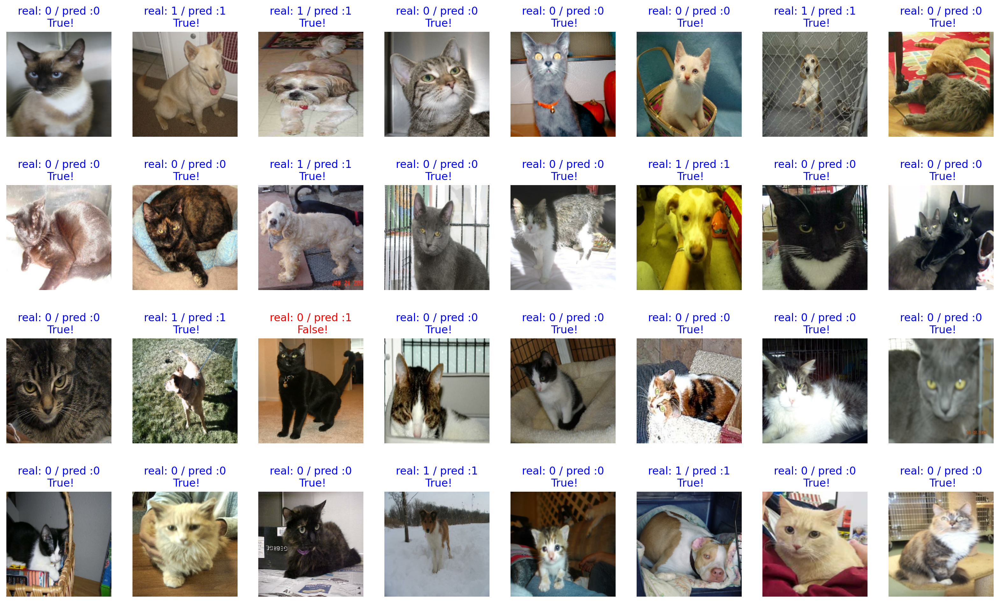

In [32]:
# batch 사이즈를 32로 설정하였으므로, 32장의 image/ 32개의 label /32개의 prediction을 각각을 시각화해서 확인
predictions = np.argmax(predictions, axis=1)
predictions
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')


In [33]:
# 32개 이미지 중에서 예측(prediction)의 정확도(accuracy) 얼마인지 계
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)

96.875
